# Plot 2D Climatology Maps

Create seasonal climatology and model-reference bias maps for any variable available in the configured NetCDF files. Reusable plotting logic lives in `scripts/climatology_2d_map.py`; edit the setup cell here for each application.


In [6]:
from pathlib import Path
import sys
import importlib

PROJECT_ROOT = Path.cwd().resolve()
if not (PROJECT_ROOT / "scripts").exists() and (PROJECT_ROOT.parent / "scripts").exists():
    PROJECT_ROOT = PROJECT_ROOT.parent

SCRIPTS_DIR = PROJECT_ROOT / "scripts"
if str(SCRIPTS_DIR) not in sys.path:
    sys.path.insert(0, str(SCRIPTS_DIR))

import climatology_2d_map
import pcmdi_climo_reader
importlib.reload(climatology_2d_map)
importlib.reload(pcmdi_climo_reader)

from climatology_2d_map import ClimatologyMapPlotter
from metrics_group_merger import PCMDIRun
from pcmdi_climo_reader import build_experiments_from_pcmdi_runs


In [7]:
# Plot setup. This follows the four test runs used by plot_synthetic_metrics_model_vs_cmip.ipynb.
OUTPUT_DIR = Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps")
RUN_TYPE = "model_vs_obs"
RUN_PLOTS = False
STRICT_PATHS = False

# Select any variables available in the run mean-climate metric JSONs.
# These four current runs have tas and pr JSONs; add more variables when their climo files are available.
PLOT_VARIABLES = ["tas", "pr", "psl"]

# Use "OBS" for variable-specific observational references, or use one model label,
# e.g. "v3.LR.CPL", when you want model-vs-model maps using that model as reference.
REF_NAME = "OBS"
INCLUDE_OBS_REFERENCE = True

VARIABLE_REFERENCE_LABELS = {
    "tas": "ERA5",
    "pr": "GPCP_v2_3",
    "psl": "ERA5",
}
METRIC_BOX_ALPHA = 0.45
PANEL_LAYOUT = "season_rows"
RUN_PLOTS = True

# Plot appearance controls.
MAP_FONT_SIZE = 16
MAP_FIG_SIZE = (24, 20)
MAP_DPI = 300

GRID_KWARGS = {
    "left": 0.05,
    "right": 0.95,
    "top": 0.93,
    "bottom": 0.07,
    "wspace": 0.12,
    "hspace": 0.08,
}

BIAS_ONLY_FONT_SIZE = 14
BIAS_ONLY_FIG_SIZE = (19, 14)
BIAS_ONLY_DPI = 150
BIAS_ONLY_SHOW_BORDERS = False
BIAS_ONLY_COLORBAR_WIDTH = 0.045
BIAS_ONLY_LONGITUDE_LABELS = [-160, -80, 0, 80, 160]
BIAS_ONLY_TITLE_PAD = 3
BIAS_ONLY_SUPTITLE_Y = 0.985
BIAS_ONLY_GRID_KWARGS = {
    "left": 0.05,
    "right": 0.93,
    "top": 0.88,
    "bottom": 0.07,
    "wspace": 0.02,
    "hspace": 0.24,
}

# Roots used to resolve InputClimatologyFileName and References/default/file_path from metric JSONs.
# Add the directory that contains climo files if the summary below reports unresolved paths.
CLIMO_SEARCH_ROOTS = [
    Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi"),
    Path("/global/cfs/cdirs/e3sm/diagnostics/pcmdi_data"),
    Path("/pscratch/sd/z/zhan391/e3smv4_project/diag_out"),
]

# Optional per-model roots, useful when climo files are stored outside the raw PCMDI run directory.
# Keys should match output_name values in TEST_RUNS.
CLIMO_SEARCH_ROOTS_BY_MODEL = {
    # "v3.HR.CPL": [Path("/path/to/v3.HR.CPL/mean_climate")],
    # "v4P.CPL": [Path("/path/to/v4P.CPL/mean_climate")],
    # "v4P.AMIP": [Path("/path/to/v4P.AMIP/mean_climate")],
}

TEST_RUNS = [
    PCMDIRun(
        case="20231209.v3.LR.piControl-spinup.chrysalis",
        model_name="EAMXX-ne256_coupled-test",
        metrics_case_id="v20260531",
        output_name="v3.LR.CPL",
        www=Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi"),
    ),
    PCMDIRun(
        case="20250906.wcycl1850.ne120pg2_r025_RRSwISC6to18E3r5.test6.1.chrysalis",
        model_name="v3-HR_test6-1",
        metrics_case_id="v20260601",
        output_name="v3.HR.CPL",
        www=Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi"),
    ),
    PCMDIRun(
        case="20260204.ne256.WCYCLXX1850.SOI",
        model_name="EAMXX-ne256_coupled-test",
        metrics_case_id="v20260601",
        output_name="v4P.CPL",
        www=Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi"),
    ),
    PCMDIRun(
        case="ne256pg2_ne256pg2.F20TR-SCREAMv1.July-1.spanc800.2xauto.acc150.n0032.test2.1",
        model_name="EAMXX_test2_1",
        metrics_case_id="v20260531",
        output_name="v4P.AMIP",
        www=Path("/global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi"),
    ),
]

VARIABLE_UNITS = {
    "tas": "tas (K)",
    "pr": "pr (mm day$^{-1}$)",
    "psl": "psl (hPa)",
}

VARIABLE_SCALE_FACTORS = {
    # Unit-aware precipitation conversion is handled by ClimatologyMapPlotter.
}

VAR_LEVELS = {
    "default": {
        "raw_levels": None,
        "diff_levels": None,
        "cmap_raw": "viridis",
        "cmap_diff": "RdBu_r",
    },
    "tas": {
        "raw_levels": None,
        "diff_levels": [-15, -10, -5, -2, -1, -0.5,-0.2, 0.2, 0.5, 1, 2, 5, 10, 15],
        "cmap_raw": "YlOrRd",
        "cmap_diff": "RdBu_r",
    },
    "pr": {
        "raw_levels": None,
        "diff_levels": [-6, -4, -2, -1, -0.5, -0.2, 0.2, 0.5, 1, 2, 4, 6],
        "cmap_raw": "YlGnBu",
        "cmap_diff": "BrBG",
    },
    "psl": {
        "raw_levels": None,
        "diff_levels": [-16, -12, -8, -5, -3, -2, -1, -0.5, 0.5, 1, 2, 3, 5, 8, 12, 16],
        "cmap_raw": "YlOrBr",
        "cmap_diff": "PiYG",
    },
}


In [8]:
EXPERIMENTS = build_experiments_from_pcmdi_runs(
    TEST_RUNS,
    PLOT_VARIABLES,
    run_type=RUN_TYPE,
    search_roots=CLIMO_SEARCH_ROOTS,
    search_roots_by_model=CLIMO_SEARCH_ROOTS_BY_MODEL,
    include_reference=INCLUDE_OBS_REFERENCE,
    reference_name=REF_NAME,
    strict=STRICT_PATHS,
)

print("Resolved climatology files:")
for experiment, var_paths in EXPERIMENTS.items():
    print(f"  {experiment}")
    for variable in PLOT_VARIABLES:
        path = var_paths.get(variable)
        print(f"    {variable}: {path if path else 'MISSING'}")

if REF_NAME not in EXPERIMENTS:
    print(f"[WARN] REF_NAME={REF_NAME!r} was not resolved. Set REF_NAME to one of the model labels or add CLIMO_SEARCH_ROOTS.")


Resolved climatology files:
  OBS
    tas: /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate/climo_ref/obs.historical.ERA5.00.Amon.tas.199501-200412.AC.v20260604.nc
    pr: /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate/climo_ref/obs.historical.GPCP_v2_3.00.Amon.pr.199501-200412.AC.v20260604.nc
    psl: /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate/climo_ref/obs.historical.ERA5.00.Amon.psl.199501-200412.AC.v20260604.nc
  v3.LR.CPL
    tas: /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/20231209.v3.LR.piControl-spinup.chrysalis/pcmdi_diags/model_vs_obs/metrics_data/mean_climate/climo/e3sm.historical.v3-LR.piControl-spinup.Amon.tas.199501-200412.AC.v20260604.nc
    pr: /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/

/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: Futur

[INFO] Saved /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps/climatology_bias_grid_tas.png


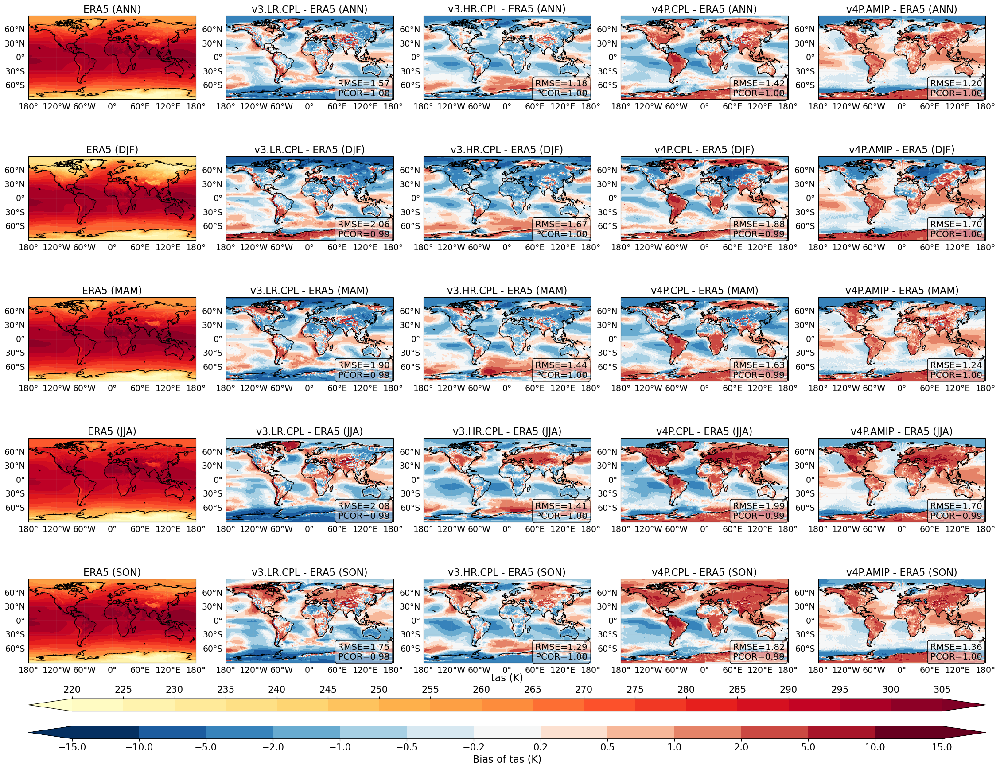

/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: Futur

[INFO] Saved /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps/climatology_bias_grid_pr.png


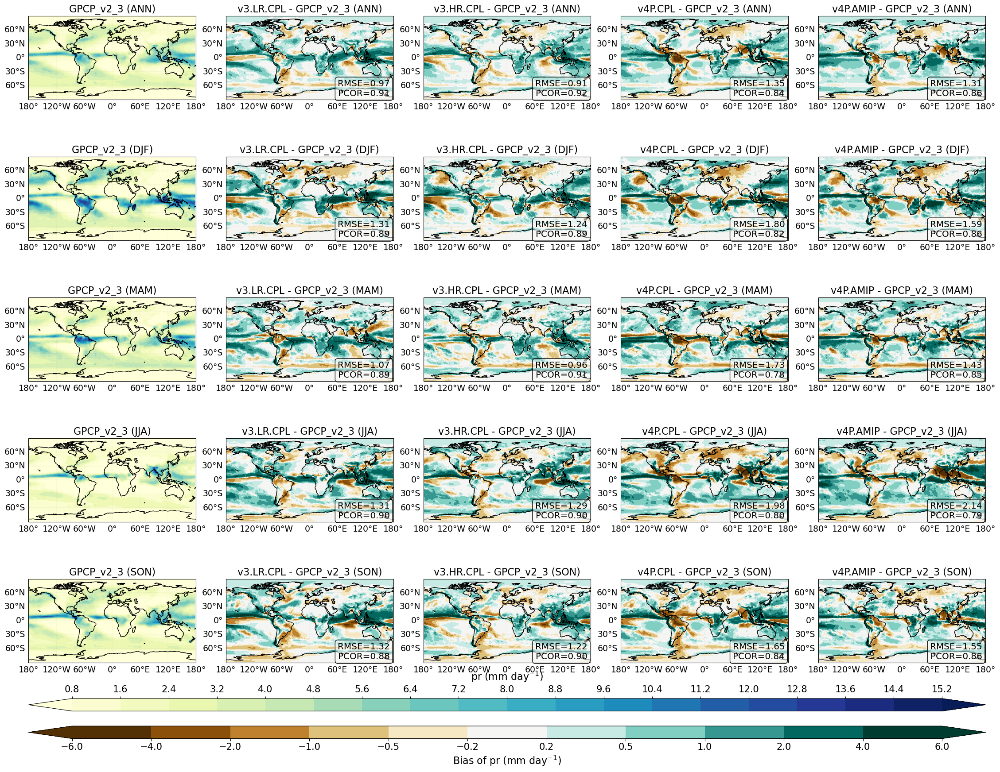

/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: Futur

[INFO] Saved /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps/climatology_bias_grid_psl.png


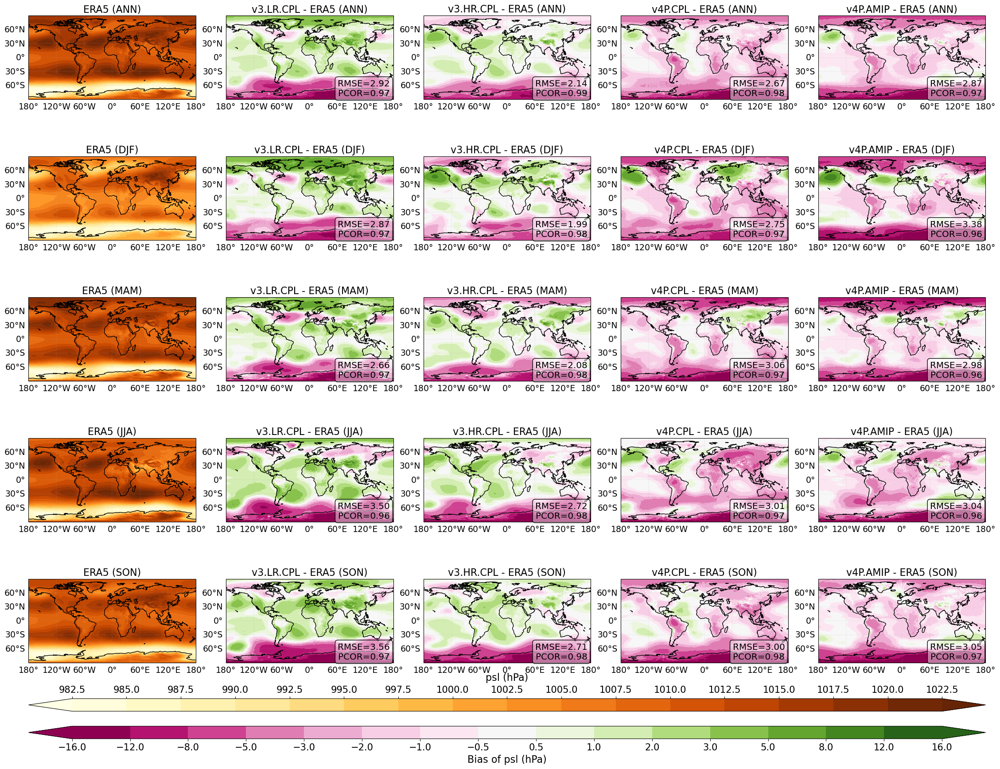

In [9]:
if RUN_PLOTS:
    plotter = ClimatologyMapPlotter(
        EXPERIMENTS,
        save_dir=OUTPUT_DIR,
        ref_name=REF_NAME,
        unit_map=VARIABLE_UNITS,
        scale_map=VARIABLE_SCALE_FACTORS,
    )
    for var_name in PLOT_VARIABLES:
        levels = VAR_LEVELS.get(var_name, VAR_LEVELS["default"])
        plotter.plot_variable(
            var_name=var_name,
            cmap1=levels["cmap_raw"],
            cmap2=levels["cmap_diff"],
            levels1=levels["raw_levels"],
            levels2=levels["diff_levels"],
            font_size=MAP_FONT_SIZE,
            fig_size=MAP_FIG_SIZE,
            dpi=MAP_DPI,
            ref_label=VARIABLE_REFERENCE_LABELS.get(var_name, REF_NAME),
            metric_box_alpha=METRIC_BOX_ALPHA,
            panel_layout=PANEL_LAYOUT
        )
else:
    print("Set RUN_PLOTS = True after checking the resolved EXPERIMENTS paths above.")


/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: Futur

[INFO] Saved /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps/climatology_bias_only_tas.png


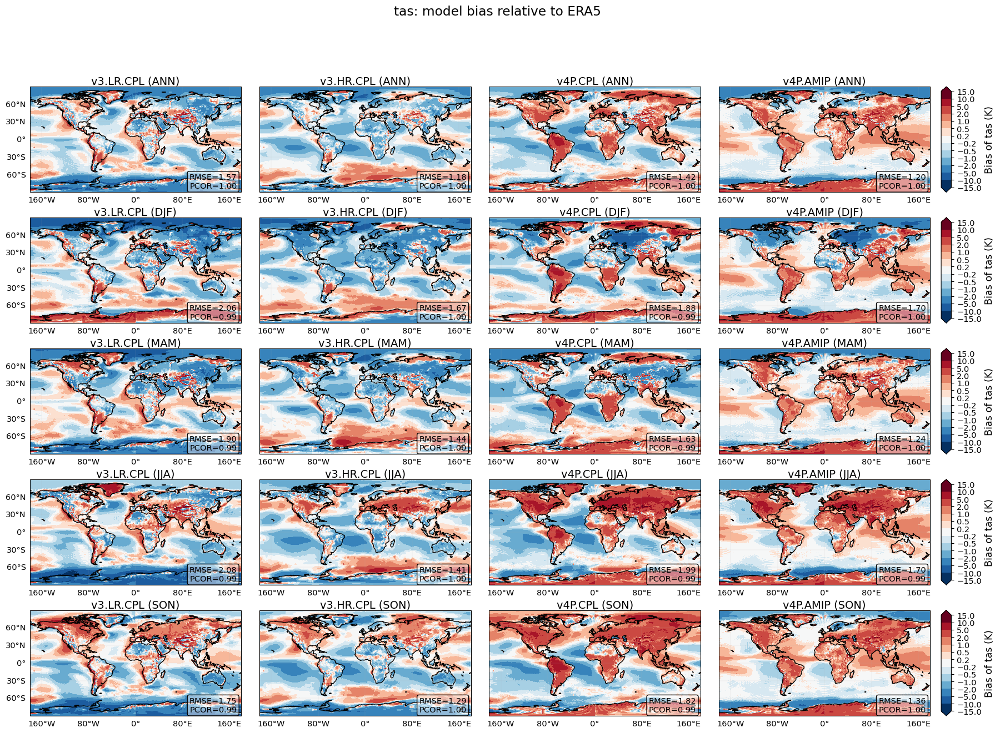

/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: Futur

[INFO] Saved /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps/climatology_bias_only_pr.png


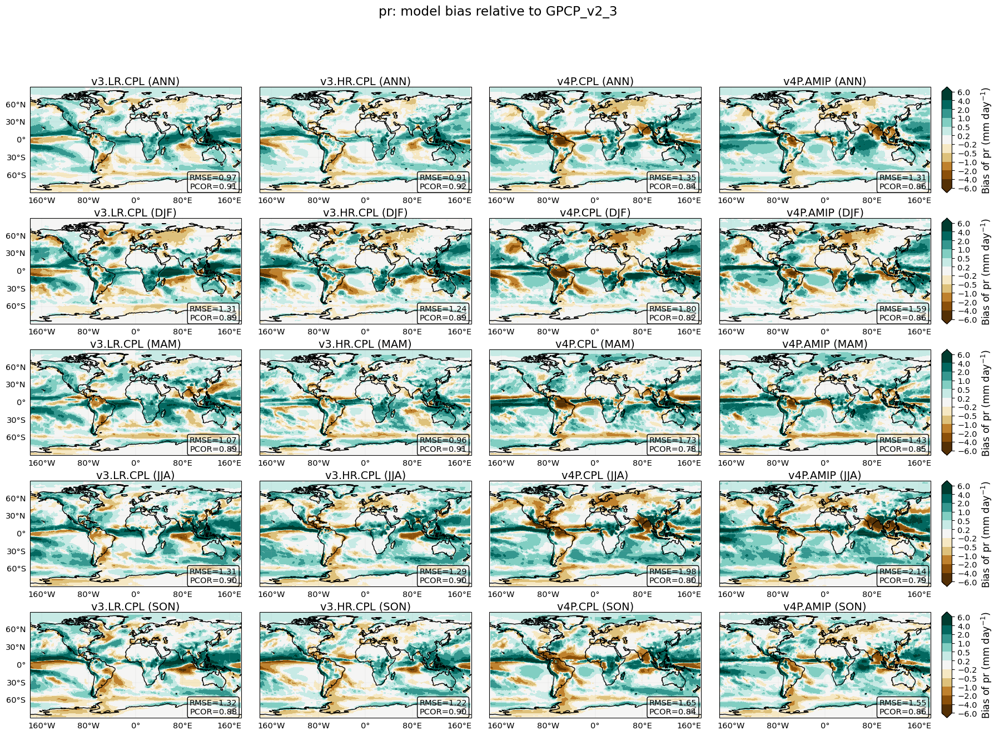

/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: FutureWarning: cftime_range() is deprecated, please use xarray.date_range(..., use_cftime=True) instead.
  da["time"] = xr.cftime_range(start="2000-01-01", periods=da.sizes["time"], freq="MS")
/pscratch/sd/z/zhan391/e3smv4_project/allhands_meeting/pcmdi_package/scripts/climatology_2d_map.py:210: Futur

[INFO] Saved /global/cfs/cdirs/e3sm/www/zhan391/eamxx-pcmdi/analysis_output/global_maps/climatology_bias_only_psl.png


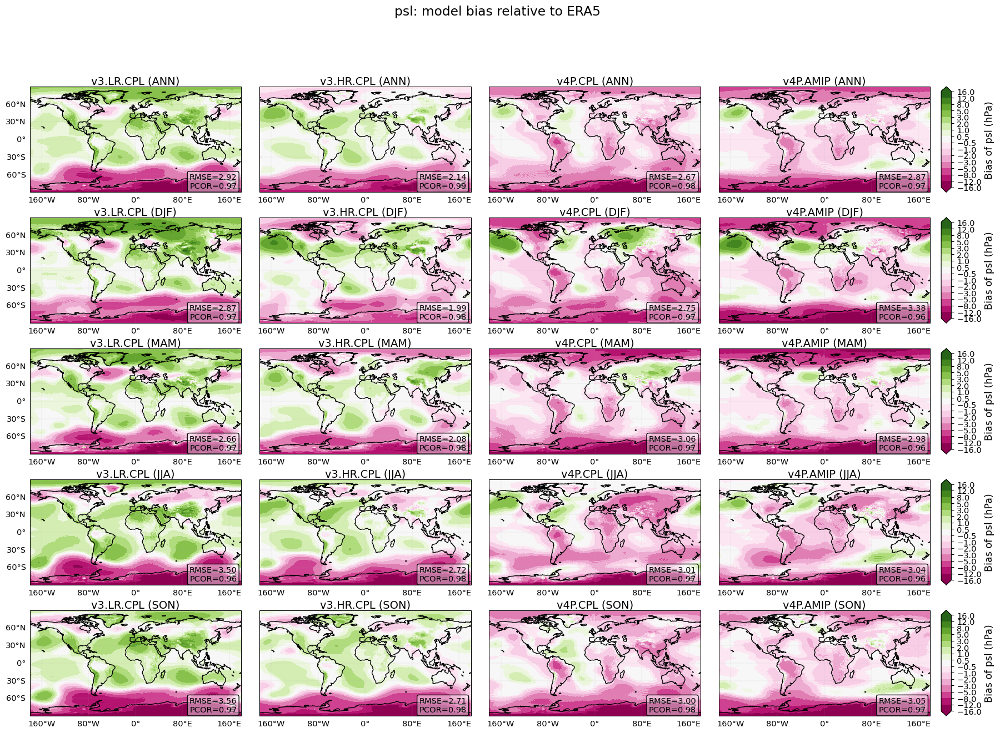

In [10]:
# Bias-only maps: seasons are rows, models are columns, with one vertical colorbar per season row.            
if RUN_PLOTS:
    import matplotlib as mpl
    import matplotlib.pyplot as plt
    import numpy as np
    import matplotlib.ticker as mticker
    import cartopy.crs as ccrs
    import cartopy.feature as cfeature
    def plot_bias_only_by_model(
        plotter,
        var_name,
        *,
        cmap="RdBu_r",
        levels=None,
        font_size=14,
        fig_size=None,
        dpi=150,
        ref_label=None,
        metric_box_alpha=0.65,
        show_borders=False,
        colorbar_width=0.045,
        longitude_labels=None,
        title_pad=3,
        suptitle_y=0.985,
        grid_kwargs=None,
    ):
        ref = plotter.ref_name
        if ref not in plotter.exp_dict:
            raise ValueError(f"Reference {ref!r} is not in exp_dict.")

        all_fields = plotter._compute_all_fields(var_name)
        ref_data = all_fields[ref]
        model_exps = [exp for exp in plotter.exp_dict if exp != ref]
        if not model_exps:
            raise ValueError("No model experiments found after removing the reference.")

        seasons = plotter.season_order
        unit_label = plotter.unit_map.get(var_name, var_name)
        ref_display = ref_label or ref
        fig_size = fig_size or (4.4 * len(model_exps) + 1.0, 2.8 * len(seasons))
        grid_kwargs = {
            "left": 0.05,
            "right": 0.95,
            "top": 0.93,
            "bottom": 0.07,
            "wspace": 0.08,
            "hspace": 0.12,
            **(grid_kwargs or {}),
        }

        fig = plt.figure(figsize=fig_size)
        grid = fig.add_gridspec(
            len(seasons),
            len(model_exps) + 1,
            width_ratios=[1.0] * len(model_exps) + [colorbar_width],
            **grid_kwargs,
        )

        norm = None
        contour_kwargs = {}
        if levels is not None:
            norm = mpl.colors.BoundaryNorm(boundaries=levels, ncolors=plt.get_cmap(cmap).N)
            contour_kwargs.update({"levels": levels, "vmin": levels[0], "vmax": levels[-1]})
        else:
            contour_kwargs["levels"] = 20

        for i, season in enumerate(seasons):
            row_im = None
            for j, exp in enumerate(model_exps):
                ax = fig.add_subplot(grid[i, j], projection=ccrs.PlateCarree())
                model_data = all_fields[exp][season]
                ref_on_model_grid = plotter._reference_on_model_grid(ref_data[season], model_data)
                bias = model_data - ref_on_model_grid

                ax.set_global()
                ax.coastlines()
                if show_borders:
                    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
                gl = ax.gridlines(draw_labels=True, linewidth=0.2, alpha=0.5)
                gl.top_labels = False
                gl.right_labels = False
                gl.left_labels = j == 0
                gl.bottom_labels = True
                if longitude_labels is not None:
                    gl.xlocator = mticker.FixedLocator(longitude_labels)
                gl.xlabel_style = {"size": font_size * 0.75}
                gl.ylabel_style = {"size": font_size * 0.75}

                row_im = ax.contourf(
                    bias["lon"].values,
                    bias["lat"].values,
                    bias,
                    transform=ccrs.PlateCarree(),
                    cmap=cmap,
                    norm=norm,
                    extend="both",
                    **contour_kwargs,
                )

                ax.set_title(f"{exp} ({season})", fontsize=font_size, pad=title_pad)

                weights = plotter._area_weights_like(model_data)
                rmse = plotter._weighted_rmse(model_data, ref_on_model_grid, weights)
                pcor = plotter._weighted_pcor(model_data, ref_on_model_grid, weights)
                ax.text(
                    0.98,
                    0.02,
                    f"RMSE={rmse:.2f}\nPCOR={pcor:.2f}",
                    transform=ax.transAxes,
                    fontsize=font_size * 0.75,
                    va="bottom",
                    ha="right",
                    bbox=dict(
                        facecolor=(1.0, 1.0, 1.0, metric_box_alpha),
                        edgecolor="black",
                        boxstyle="round,pad=0.25",
                    ),
                )

            cax = fig.add_subplot(grid[i, -1])
            cbar = fig.colorbar(row_im, cax=cax, orientation="vertical", extend="both")
            if levels is not None:
                cbar.set_ticks(levels)
            cbar.set_label(f"Bias of {unit_label}", fontsize=font_size * 0.9)
            cbar.ax.tick_params(labelsize=font_size * 0.75)

        fig.suptitle(
            f"{var_name}: model bias relative to {ref_display}",
            fontsize=font_size * 1.2,
            y=suptitle_y,
        )

        if plotter.save_dir:
            plotter.save_dir.mkdir(parents=True, exist_ok=True)
            out_file = plotter.save_dir / f"climatology_bias_only_{var_name}.png"
            plt.savefig(out_file, dpi=dpi, bbox_inches="tight")
            print(f"[INFO] Saved {out_file}")

        plt.show()

    bias_plotter = ClimatologyMapPlotter(
        EXPERIMENTS,
        save_dir=OUTPUT_DIR,
        ref_name=REF_NAME,
        unit_map=VARIABLE_UNITS,
        scale_map=VARIABLE_SCALE_FACTORS,
    )
    for var_name in PLOT_VARIABLES:
        levels = VAR_LEVELS.get(var_name, VAR_LEVELS["default"])
        plot_bias_only_by_model(
            bias_plotter,
            var_name,
            cmap=levels["cmap_diff"],
            levels=levels["diff_levels"],
            font_size=BIAS_ONLY_FONT_SIZE,
            fig_size=BIAS_ONLY_FIG_SIZE,
            dpi=BIAS_ONLY_DPI,
            ref_label=VARIABLE_REFERENCE_LABELS.get(var_name, REF_NAME),
            metric_box_alpha=METRIC_BOX_ALPHA,
            show_borders=BIAS_ONLY_SHOW_BORDERS,
            colorbar_width=BIAS_ONLY_COLORBAR_WIDTH,
            longitude_labels=BIAS_ONLY_LONGITUDE_LABELS,
            title_pad=BIAS_ONLY_TITLE_PAD,
            suptitle_y=BIAS_ONLY_SUPTITLE_Y,
            grid_kwargs=BIAS_ONLY_GRID_KWARGS,
        )
else:
    print("Set RUN_PLOTS = True after checking the resolved EXPERIMENTS paths above.")
